
### Bu veri kümesi, New York City'de yer alan Airbnb ev sahipleri tarafından sunulan konaklama birimlerine ilişkin bilgileri içerir. Veri seti, ev sahiplerinin listelerinin özelliklerini, fiyatlarını, konumlarını, rezervasyon durumunu ve diğer çeşitli detayları içeren geniş bir bilgi yelpazesini kapsar

### Veri kümesi, aşağıdaki özellikleri içeren çeşitli sütunlardan oluşmaktadır:

id: Airbnb listesinin benzersiz kimliği

name: Konaklama biriminin adı

host_id: Ev sahibinin benzersiz kimliği

host_name: Ev sahibinin adı

neighbourhood_group: Mahalle gruplarına (örneğin, Manhattan, Brooklyn) ait bilgiler

neighbourhood: Mahalle adı

latitude: Konaklama biriminin enlem koordinatı

longitude: Konaklama biriminin boylam koordinatı

room_type: Konaklama biriminin tipi (Özel oda, Tüm ev/daire, Paylaşımlı oda vb.)

price: Gece başına talep edilen fiyat

minimum_nights: Minimum konaklama süresi

number_of_reviews: Aldığı yorum sayısı

last_review: Son yapılan yorumun tarihi

reviews_per_month: Aylık ortalama yorum sayısı

calculated_host_listings_count: Ev sahibinin toplam listeleme sayısı

availability_365: Yıl boyunca doluluk oranı

### New York City'deki yaklaşık 50.000 BNB tesisi hakkında bilinen bilgiler, bunların hangi dallarda bulundukları, tek misafirlere mi yoksa tüm ailelere mi hitap ettikleri, ne kadar alan sundukları ve ne kadar pahalı oldukları.

# **Airbnb Veriseti ile EDA İşlemleri**

In [1]:
#Gerekli kütüphanelerin yüklenmesi
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
import missingno as msno
warnings.filterwarnings('ignore')
#pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 500)
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")


In [2]:
df = pd.read_csv('/kaggle/input/new-york-city-airbnb-open-data/AB_NYC_2019.csv')
df.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


In [3]:
df.tail(10) #son gözlemler

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
48885,36482809,Stunning Bedroom NYC! Walking to Central Park!!,131529729,Kendall,Manhattan,East Harlem,40.79633,-73.93605,Private room,75,2,0,NaN,NaN,2,353
48886,36483010,Comfy 1 Bedroom in Midtown East,274311461,Scott,Manhattan,Midtown,40.75561,-73.96723,Entire home/apt,200,6,0,NaN,NaN,1,176
48887,36483152,Garden Jewel Apartment in Williamsburg New York,208514239,Melki,Brooklyn,Williamsburg,40.71232,-73.94220,Entire home/apt,170,1,0,NaN,NaN,3,365
48888,36484087,"Spacious Room w/ Private Rooftop, Central loca...",274321313,Kat,Manhattan,Hell's Kitchen,40.76392,-73.99183,Private room,125,4,0,NaN,NaN,1,31
48889,36484363,QUIT PRIVATE HOUSE,107716952,Michael,Queens,Jamaica,40.69137,-73.80844,Private room,65,1,0,NaN,NaN,2,163
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2
48894,36487245,Trendy duplex in the very heart of Hell's Kitchen,68119814,Christophe,Manhattan,Hell's Kitchen,40.76404,-73.98933,Private room,90,7,0,NaN,NaN,1,23


In [4]:
df.info() #değişken tiplerini görüntülerim ,aynı zamanda null olmayan(eksik değer barındırmayan) gözlem değerlerini görmekteyiz.
# bazı değerierin eksik old görüyoruz -name gibi -host_name gibi   Peki Neden?

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
df.shape # veri seti boyutu

(48895, 16)

In [6]:
df.columns # kolonlarını yani değişkenlerini gör

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365'], dtype='object')

In [7]:
df.describe() # min,mean,count,max gibi değerleri gözlemlerim
# std= standart sapma

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [8]:
#pandas profiling ile verisetine genel bakış ÖNEMLİ KÜTÜPHANE !!!
import pandas_profiling
profile = pandas_profiling.ProfileReport(df)
profile.to_file(output_file='Airbnb.html')
profile
# genel olarak veri vesitini özetlerim ,tanımlamayı yapıp output elde ederim
# Veri ile ilgili çeşitli kararlar alırken bize öncülük edebilir.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Değişken Türlerinin İncelenmesi # 

In [9]:
df.info() 
"""""
Bu kısımda bazı değişkenlerimin türünün yanlış olduğunu gözlemleyebilirim.Örneğin 
last_review gibi.Bu tarih değişkeni fakat object (kategorik) olarak sınıflandırılmış. Sayısal mı olmalıydı ?
Hangi formatta bırakacağımız tamamiyen yapacağımız analize göre değişir
int mümerik bir değişken
Eğer aynı host_id sahip kayıtlar var ise çünkü bunlar ev sahibine ait olan bir id , aynı evi birden çok kiralamış olabilirler. Bunu gözlemlemek için bu değişkeni kategorik yapabiliriz
yapmayadabilirz.Tamamiyen yapacağımız çalışmaya göre değişkenlik belirtmekte.

"""

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

'""\nBu kısımda bazı değişkenlerimin türünün yanlış olduğunu gözlemleyebilirim.Örneğin \nlast_review gibi.Bu tarih değişkeni fakat object (kategorik) olarak sınıflandırılmış. Sayısal mı olmalıydı ?\nHangi formatta bırakacağımız tamamiyen yapacağımız analize göre değişir\nint mümerik bir değişken\nEğer aynı host_id sahip kayırlar var ise çünkü bunlar ev sahibine ait olan bir id , aynı evi birden çok kiralamış olabilirler. Bunu gözlemlemek için bu değişkeni kategorik yapabiliriz\nyapmayadabilirz.Tamamiyen yapacağımız çalışmaya göre değişkenlik belirtmekte.\n\n'

In [10]:
df.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


**Değişken Türlerinin Düzenlenmesi**

In [11]:
#int to object
df["host_id"]=df["host_id"].astype(object) # işlemi kalıcı hale getirmek için eşittir işareti koydum.
df["host_id"].dtype

#Aynı host_id ye sahip birden çok kişi olabilir çünkü bu ev sahibinin id'si
#bunu gözlemlemek için bu değişkeni kategorik yapabiliriz. Daha fazla analiz yaparak 
#süreci iyi gözlemleyebiliriz.
#object = kategorik



dtype('O')

In [12]:
#en çok kayda sahip olan ve bu hizmetten faydalanan ev sahipleri
df["host_id"].value_counts().nlargest(4) # en çok olan 4 taneyi getir diyorum
#df["host_id"].value_counts()head(3) # head lede yaparım nlargest te olur :)


219517861    327
107434423    232
30283594     121
137358866    103
Name: host_id, dtype: int64

In [13]:
#  datetime a çevirim yapıyoruz
# bu kısımda last review için bir düzenleme mevcut 
df['last_review'] = df['last_review'].apply(lambda x: pd.to_datetime(x))
df['last_review'].dtype.name 
# atama yaparken apply lambda metoduyla yani uygula diyerek datetime a çevir diyerek gözlemlerim.

'datetime64[ns]'

In [14]:
df['last_review'].head() # bir bakalım olmuş mu

0   2018-10-19
1   2019-05-21
2          NaT
3   2019-07-05
4   2018-11-19
Name: last_review, dtype: datetime64[ns]

### Tarih Değişkeninden Yeni Değişkenler Türetilmesi

##### Feature Engineering (ML)

In [15]:
df['day_of_week'] = df.last_review.dt.dayofweek # haftanın hangi günü ->dayofweek method   
df['day_of_week'].head()        # örneğin haftaın günlerine göre satış tahminlemesi yapabilirz 

# Bir nevi feature Engineering diyebilirmiyiz !!

0    4.0
1    1.0
2    NaN
3    4.0
4    0.0
Name: day_of_week, dtype: float64

In [16]:
df['last_review'].head(10)
# boş değeri gördüm bir nevi doğrulama yaptım

0   2018-10-19
1   2019-05-21
2          NaT
3   2019-07-05
4   2018-11-19
5   2019-06-22
6   2017-10-05
7   2019-06-24
8   2017-07-21
9   2019-06-09
Name: last_review, dtype: datetime64[ns]

In [17]:
df["is_weekend"] = df.last_review.dt.weekday // 5 # bu kısımda hangi gün tatil ona baktım - hafta sonu mu degil mi
df["is_weekend"].head(10)

0    0.0
1    0.0
2    NaN
3    0.0
4    0.0
5    1.0
6    0.0
7    0.0
8    0.0
9    1.0
Name: is_weekend, dtype: float64

**Bazı Gözlemlerin Silinmesi**

In [18]:
#price 0 olan değişkenleri gözlemliyoruz. Sıfır değerleri yapısal bir yanlışlıktan ötürü olabilir.
df[df['price']==0]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
23161,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,2018-01-06,0.05,4,28,5.0,1.0
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127,0.0,0.0
25634,20523843,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,2019-05-18,0.71,5,0,5.0,1.0
25753,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2017-10-27,0.53,2,0,4.0,0.0
25778,20624541,Modern apartment in the heart of Williamsburg,10132166,Aymeric,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,2018-01-02,0.15,1,73,1.0,0.0
25794,20639628,Spacious comfortable master bedroom with nice ...,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68173,-73.91342,Private room,0,1,93,2019-06-15,4.28,6,176,5.0,1.0
25795,20639792,Contemporary bedroom in brownstone with nice view,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,0,1,95,2019-06-21,4.37,6,232,4.0,0.0
25796,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,2019-06-23,4.35,6,222,6.0,1.0
26259,20933849,the best you can find,13709292,Qiuchi,Manhattan,Murray Hill,40.75091,-73.97597,Entire home/apt,0,3,0,NaT,NaN,1,0,NaN,NaN
26841,21291569,Coliving in Brooklyn! Modern design / Shared room,101970559,Sergii,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,0,30,2,2019-06-22,0.11,6,333,5.0,1.0


In [19]:
#bu yüzden price'ı 0'a eşit olan gözlem değerleri silinebilir
df.drop(df[df['price']==0].index,inplace=True) # silmek istersek bu methodu kullanabiliriz

In [20]:
#benzer şekilde uygunluğu 0 olanlar ve min night ı 1 yıldan fazla olanları silebiliriz.
#df.drop(df[df['availability_365']==0].index,inplace=True)
#df.drop(df[df.minimum_nights >365].index, inplace=True)

**List Comphrension Yapısı ile Kategorik ve Nümerik Değişkenlerin Yakalanması**

In [21]:
cat_cols = [col for col in df.columns if df[col].dtypes == "O"]
cat_cols
# kategori type ları object olanları al diyoruz (dtypes==0) ile

['name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'room_type']

In [22]:
num_cols = [col for col in df.columns if df[col].dtypes != "O" and "last_review" not in col]
num_cols
# bu kısımda kategorik olmayanları al
# last_review bunu kategorik çevirdiğimizden dolayı dahil etmiyoruz

['id',
 'latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'day_of_week',
 'is_weekend']


# Eksik Değer Analizi

In [23]:
df.isnull().any() # eksik değer var mı bu method ile gözlemlerim
# True /false döner -eksiklik var mı yok mu

id                                False
name                               True
host_id                           False
host_name                          True
neighbourhood_group               False
neighbourhood                     False
latitude                          False
longitude                         False
room_type                         False
price                             False
minimum_nights                    False
number_of_reviews                 False
last_review                        True
reviews_per_month                  True
calculated_host_listings_count    False
availability_365                  False
day_of_week                        True
is_weekend                         True
dtype: bool

In [24]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10051
reviews_per_month                 10051
calculated_host_listings_count        0
availability_365                      0
day_of_week                       10051
is_weekend                        10051
dtype: int64

In [25]:
#na_columns - boş kolonları yakalama
na_columns = [col for col in df.columns if df[col].isnull().sum() > 0]

In [26]:
#n_miss_ratio
n_miss_ratio = (df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
n_miss_ratio # shape bize gözlem değerlerini ifade eder. Yüzdelik olarak getiriyoruz bunları
# Review da %20 lik boşluk var hadi dolduralım !

# Sakın böyle bir şey yapma adamlar zaten yorum yapmamış !!
# Eksik verileri analiz ederken doldurulcak şeyler var doldurulmayacak şeyler var. 

last_review          20.560920
reviews_per_month    20.560920
day_of_week          20.560920
is_weekend           20.560920
host_name             0.042959
name                  0.032731
dtype: float64

In [27]:
np.round((df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False), 2)
# numpy ın round metoduyla virgülden sonra 2 hane getiriyoruz

last_review          20.56
reviews_per_month    20.56
day_of_week          20.56
is_weekend           20.56
host_name             0.04
name                  0.03
dtype: float64

In [28]:
np.round(n_miss_ratio, 2)

last_review          20.56
reviews_per_month    20.56
day_of_week          20.56
is_weekend           20.56
host_name             0.04
name                  0.03
dtype: float64

**Eksik değerlerin görselleştirilmesi**

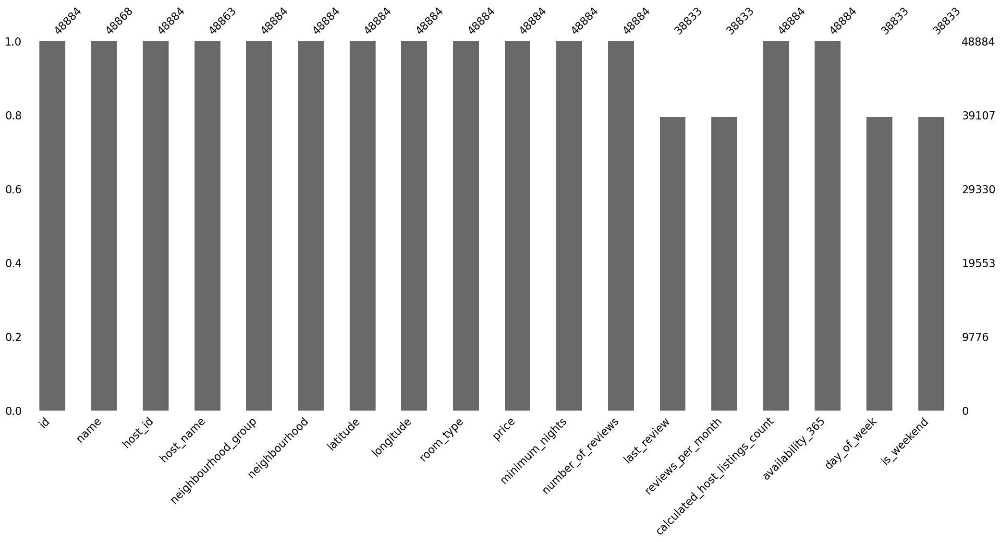

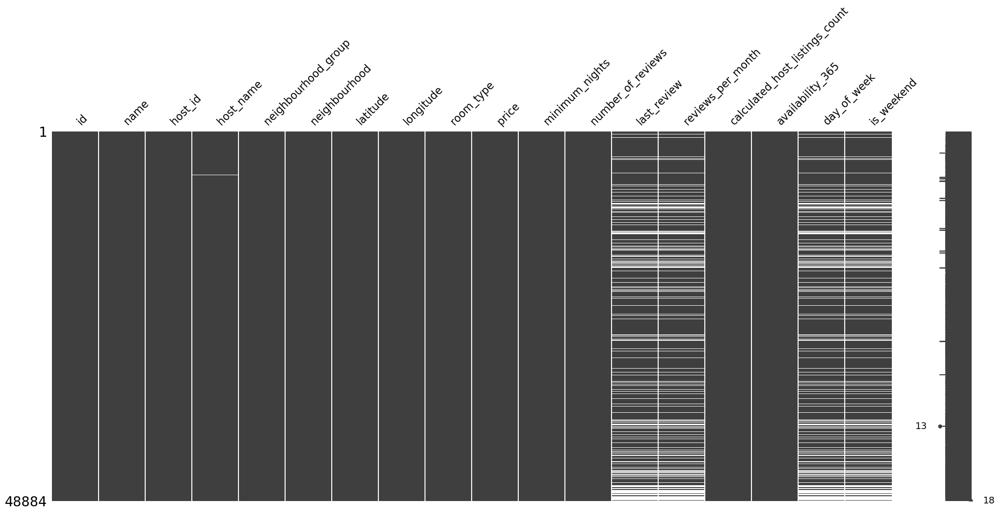

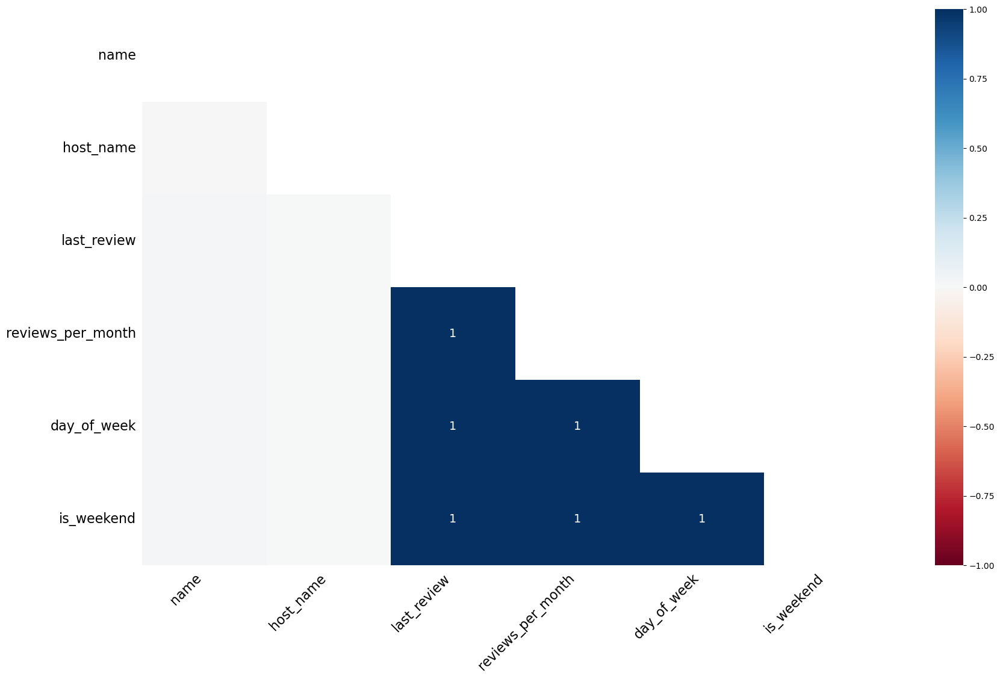

In [29]:
msno.bar(df)
plt.show()

msno.matrix(df) #ısı haritasında eksik olan değerler beyaz kalmıştır
plt.show()

msno.heatmap(df) #heatmap(sıcaklık haritası)burda da eksik değerlerin birbirleriyle ilişkisi var mı
plt.show()


**Eksik değerlerle başa çıkma**

In [30]:
#Yöntem 1. Eksik değerler verisetinden silinebilir. eğer veri setim büyükse mesela
#df.dropna()

In [31]:
#Yöntem 2. Herhangi bir değerle doldurulabilir.
df["number_of_reviews"].fillna(0)

0          9
1         45
2          0
3        270
4          9
        ... 
48890      0
48891      0
48892      0
48893      0
48894      0
Name: number_of_reviews, Length: 48884, dtype: int64

In [32]:
#ortalama ile doldurma
#df["number_of_reviews"].fillna(df["number_of_reviews"].mean())

In [33]:
#median ile doldurma
df["number_of_reviews"].fillna(df["number_of_reviews"].median())
# eksik değerlerin nedenine odaklanıp ona uygun bir doldurma yapmak mantıklı

0          9
1         45
2          0
3        270
4          9
        ... 
48890      0
48891      0
48892      0
48893      0
48894      0
Name: number_of_reviews, Length: 48884, dtype: int64

In [34]:
#null değerleri ortalama ile doldur(object değişken varsa çalışmaz)
#df.apply(lambda x: x.fillna(x.mean()), axis=0)

In [35]:
#tipi object olmayanları ortalama ile doldur, obejct olanlar aynı kalsın
#df.apply(lambda x: x.fillna(x.mean()) if x.dtype != "O" else x, axis=0).head()

#kaydetmek için dff
#df.reviews_per_month.fillna(0, inplace=True) # eğer labda ile atama yapmışsak yaptığımız dataseti başka bir dataset e aktarıyoruz
#dff = df.apply(lambda x: x.fillna(x.mean()) if x.dtype != "O" else x, axis=0)

In [36]:
#tipi object olanlar mode ile doldurulmalıdır. tipi kategorik ise mod ile çünkü sayılamayan bir değer
# mod-> en çok tekrar eden değer
df["host_name"].fillna(df["host_name"].mode())
df["name"].fillna(df["name"].mode())

0                       Clean & quiet apt home by the park
1                                    Skylit Midtown Castle
2                      THE VILLAGE OF HARLEM....NEW YORK !
3                          Cozy Entire Floor of Brownstone
4         Entire Apt: Spacious Studio/Loft by central park
                               ...                        
48890      Charming one bedroom - newly renovated rowhouse
48891        Affordable room in Bushwick/East Williamsburg
48892              Sunny Studio at Historical Neighborhood
48893                 43rd St. Time Square-cozy single bed
48894    Trendy duplex in the very heart of Hell's Kitchen
Name: name, Length: 48884, dtype: object

In [37]:
#Yöntem 3. scikitlearn aracılığıyla eksik değerleri doldurulabilir.
#from sklearn.impute import SimpleImputer
#imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
#imp_mean.fit(df)
#imp_mean.transform(df)

### eğer eksik değer var ise nedenine odaklanıp ona denk değerler atamak gereklidir

In [38]:
#Yöntem 4. Eğer price değişkeninde eksik değer olsaydı bölgeye göre price ort. ile doldurabilirdik.
df.groupby("neighbourhood_group")["price"].mean()

neighbourhood_group
Bronx             87.577064
Brooklyn         124.438915
Manhattan        196.884903
Queens            99.517649
Staten Island    114.812332
Name: price, dtype: float64

In [39]:
#eksik değerleri bölgeye göre groupby a alıp price ortalamaları ile değiştirme
#df["price"].fillna(df.groupby("neighbourhood_group")["price"].transform("mean"))

# Aykırı Değer Analizi - iqr ile tespit yapılabilir

### Bir veri setinde diğer gözlemlere çok uzak gözlem değerleridir

In [40]:
#aykırı değerler için kartillerin belirlenmesi
q1 = df["price"].quantile(0.25)
q3 = df["price"].quantile(0.75)
iqr = q3 - q1
up = q3 + 1.5 * iqr
low = q1 - 1.5 * iqr

In [41]:
#aykırı değerlerin tespiti
df[(df["price"] > up) | (df["price"] < low)].any(axis=None)

True

In [42]:
#aykırı değerlerin alt ve üst limitlerle baskılanmasını yaparım-> böylelikle aykırı değerlerden kurtulurum
#df.loc[(df["price"] > up), "price"] = up
#df.loc[(df["price"] < low), "price"] = low

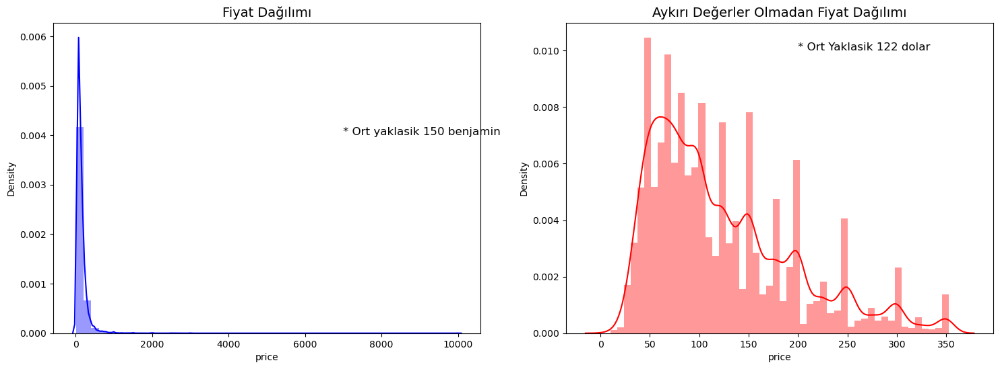

In [43]:
# Fiyat ortalaması
fig, axs = plt.subplots(ncols=2, figsize=(18,6))

#Filtrelemeden çizim yapmak için
sns.distplot(df['price'], color = 'blue', ax=axs[0])
axs[0].set_title('Fiyat Dağılımı', size=14)
axs[0].text(7000,0.004,'* Ort yaklasik 150 benjamin', size=12)

# Şimdi filtre ile çizim
q = df.price.quantile(.95)
sns.distplot(df.price[df.price<q], color = 'red', ax=axs[1])
axs[1].set_title('Aykırı Değerler Olmadan Fiyat Dağılımı', size=14)
axs[1].text(200,0.01,'* Ort Yaklasik 122 dolar', size=12)

plt.show()

# Görselleştirmeler ve Çeşitli İçgörüler

id
Skew : -0.09


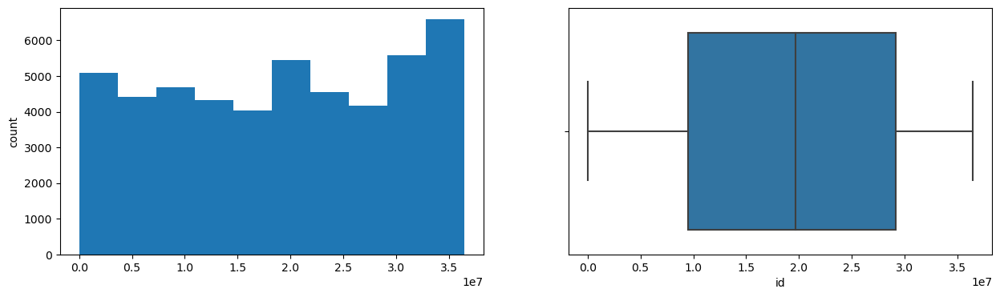

latitude
Skew : 0.24


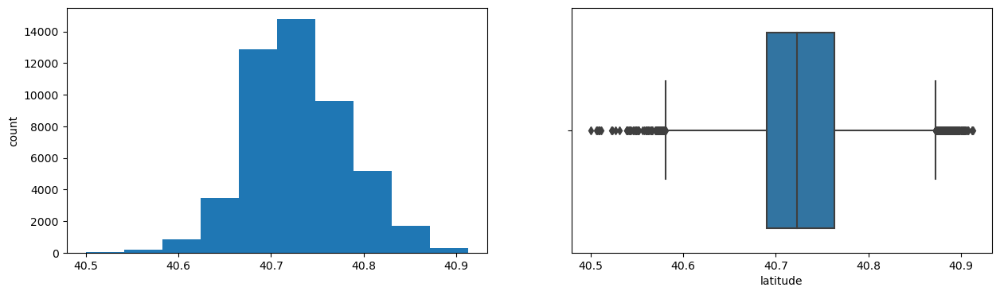

longitude
Skew : 1.28


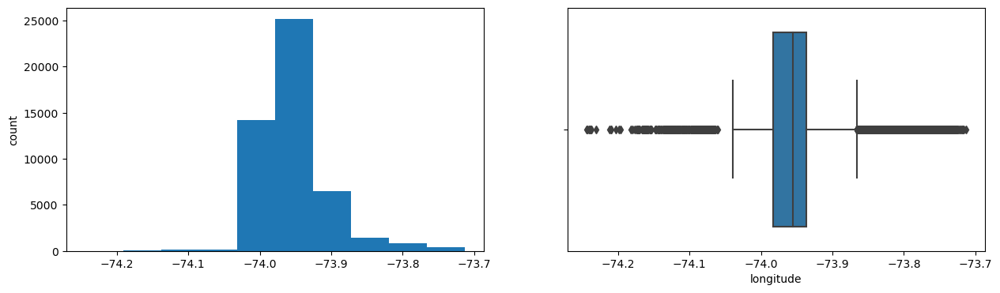

price
Skew : 19.12


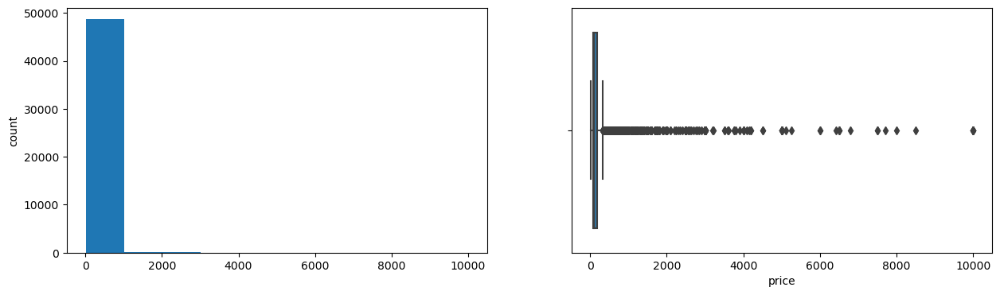

minimum_nights
Skew : 21.83


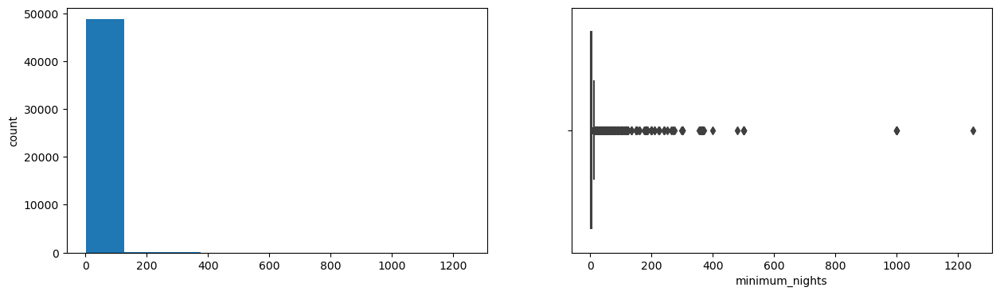

number_of_reviews
Skew : 3.69


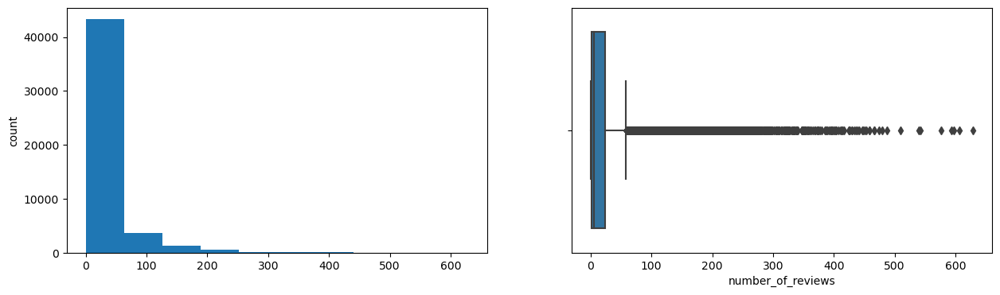

reviews_per_month
Skew : 3.13


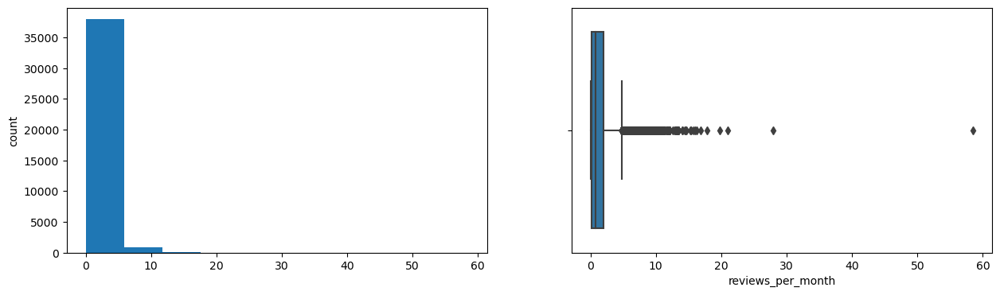

calculated_host_listings_count
Skew : 7.93


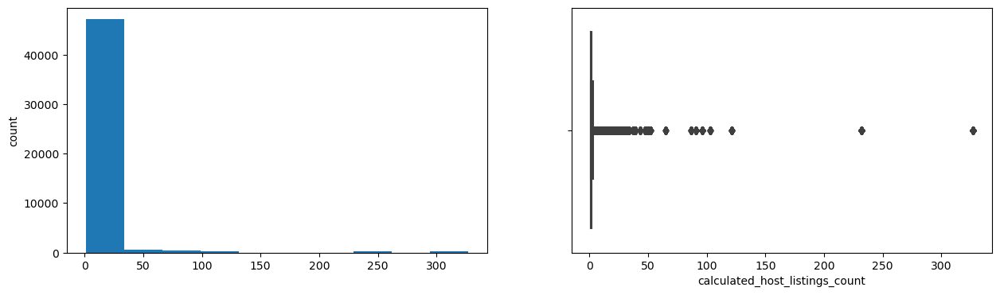

availability_365
Skew : 0.76


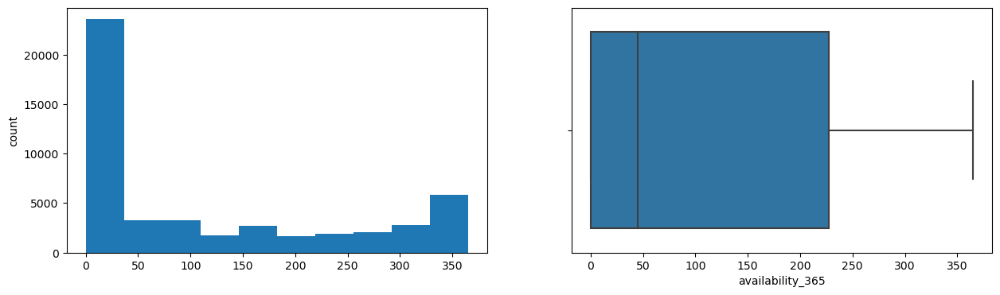

day_of_week
Skew : -0.15


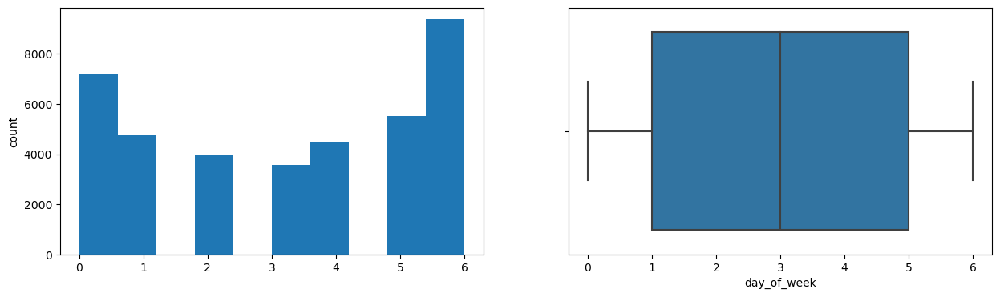

is_weekend
Skew : 0.48


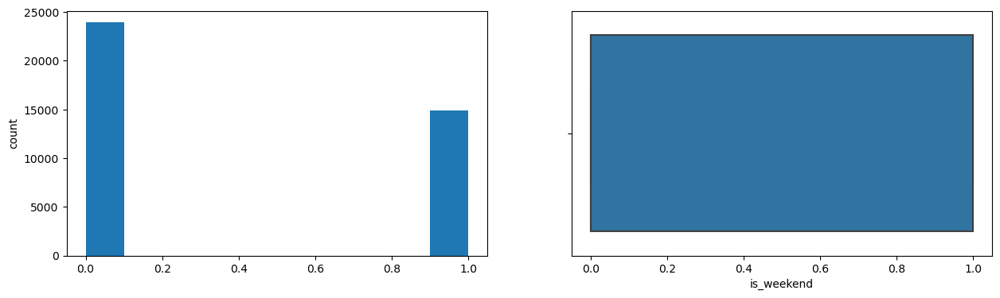

In [44]:
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2)) # çarpıklığı yaz ve iki basamağı al
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()


In [45]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,4.0,0.0
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,1.0,0.0
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaT,NaN,1,365,NaN,NaN
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,4.0,0.0
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,0.0,0.0


In [46]:
#oda tipine göre minimum kalma sayısı
df.groupby('room_type').agg( {'minimum_nights': lambda minimum_nights: minimum_nights.sum()})

,minimum_nights
room_type,
Entire home/apt,216144
Private room,120054
Shared room,7451


In [47]:
#oda tipi ve bölgeye göre min kalma sayısı
df.groupby(['room_type', 'neighbourhood_group'])['minimum_nights'].count()#.sort_values(ascending=False)

room_type        neighbourhood_group
Entire home/apt  Bronx                    379
                 Brooklyn                9558
                 Manhattan              13198
                 Queens                  2096
                 Staten Island            176
Private room     Bronx                    651
                 Brooklyn               10126
                 Manhattan               7982
                 Queens                  3372
                 Staten Island            188
Shared room      Bronx                     60
                 Brooklyn                 411
                 Manhattan                480
                 Queens                   198
                 Staten Island              9
Name: minimum_nights, dtype: int64

In [48]:
#ilgili hostun toplam min kalma süreleri
df.groupby('host_id').agg({'minimum_nights': lambda minimum_nights: minimum_nights.sum()}).sort_values(by='minimum_nights', ascending=False).nlargest(10, 'minimum_nights')
#nlargest metodu en büyük değere sahip öğleri seçmek için kullanılır(yukarıda min değerde en yüksek 10 yaptık)

,minimum_nights
host_id,
107434423,7470
219517861,4353
30283594,3767
137358866,3090
16098958,2880
12243051,2784
61391963,2760
22541573,2610
7245581,2328


In [49]:
df.loc[(df['host_id'] == 107434423)] #herhangi bir gözlem değerimi bir çekeyim

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
26137,20845031,"Homey Midtown East 1BR w/ Gym, Doorman, near t...",107434423,Blueground,Manhattan,Kips Bay,40.74510,-73.97915,Entire home/apt,308,30,0,NaT,NaN,232,156,NaN,NaN
29128,22370388,"Calming FiDi 1BR w/ lux Gym, Speakeasy + Doorm...",107434423,Blueground,Manhattan,Financial District,40.70637,-74.00941,Entire home/apt,271,30,1,2018-08-17,0.09,232,310,4.0,0.0
30158,23264421,"Mod Midtown East 1BR w/ Gym, walk to Grand Cen...",107434423,Blueground,Manhattan,Murray Hill,40.74900,-73.97961,Entire home/apt,289,30,0,NaT,NaN,232,223,NaN,NaN
30428,23538486,"Posh Park Avenue 1BR w/ Gym, Doorman in Midtow...",107434423,Blueground,Manhattan,Murray Hill,40.74891,-73.97887,Entire home/apt,305,30,1,2019-01-15,0.17,232,326,1.0,0.0
31506,24535218,"Luxury Tribeca 1BR w/ Gym, Doorman + Roof deck...",107434423,Blueground,Manhattan,Tribeca,40.71433,-74.01073,Entire home/apt,323,30,0,NaT,NaN,232,316,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48723,36404684,Smart Nolita 1BR w/ W/D near famous cafes by B...,107434423,Blueground,Manhattan,Nolita,40.72283,-73.99472,Entire home/apt,316,30,0,NaT,NaN,232,325,NaN,NaN
48724,36404784,Dapper Hell's Kitchen 2BR w/ Gym + W/D + Door...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76082,-73.99709,Entire home/apt,385,30,0,NaT,NaN,232,338,NaN,NaN
48725,36404815,Trendy Hell's Kitchen 1BR w/ Gym + W/D + Doorm...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76083,-73.99727,Entire home/apt,267,30,0,NaT,NaN,232,228,NaN,NaN
48726,36404936,Beautiful Williamsburg 2BR w/ Skyline views + ...,107434423,Blueground,Brooklyn,Williamsburg,40.71493,-73.96365,Entire home/apt,278,30,0,NaT,NaN,232,188,NaN,NaN


In [50]:
#ev sahiplerine göre aylık yorum sayısı toplamı
df.groupby('host_id')['reviews_per_month'].sum().sort_values(ascending=False).head(10)

host_id
219517861    397.56
244361589    111.72
232251881     80.63
26432133      68.02
137274917     62.89
224414117     59.10
156948703     56.44
344035        56.00
156684502     54.38
37312959      53.53
Name: reviews_per_month, dtype: float64

In [51]:
# burada en yüksek fiyatlı evin hangi bölge ve oda tipinde olduğunu gözlemliyoruz
df.groupby(['neighbourhood_group','room_type'])['price'].mean().sort_values(ascending = False)


neighbourhood_group  room_type      
Manhattan            Entire home/apt    249.257994
Brooklyn             Entire home/apt    178.346202
Staten Island        Entire home/apt    173.846591
Queens               Entire home/apt    147.050573
Bronx                Entire home/apt    127.506596
Manhattan            Private room       116.776622
                     Shared room         88.977083
Brooklyn             Private room        76.545428
Queens               Private room        71.762456
                     Shared room         69.020202
Bronx                Private room        66.890937
Staten Island        Private room        62.292553
Bronx                Shared room         59.800000
Staten Island        Shared room         57.444444
Brooklyn             Shared room         50.773723
Name: price, dtype: float64

In [52]:
#index eklemek istersek
df.groupby(['neighbourhood_group','room_type'])['price'].mean().sort_values(ascending = False).reset_index()

,neighbourhood_group,room_type,price
0,Manhattan,Entire home/apt,249.257994
1,Brooklyn,Entire home/apt,178.346202
2,Staten Island,Entire home/apt,173.846591
3,Queens,Entire home/apt,147.050573
4,Bronx,Entire home/apt,127.506596
5,Manhattan,Private room,116.776622
6,Manhattan,Shared room,88.977083
7,Brooklyn,Private room,76.545428
8,Queens,Private room,71.762456
9,Queens,Shared room,69.020202


<Axes: xlabel='neighbourhood_group', ylabel='price'>

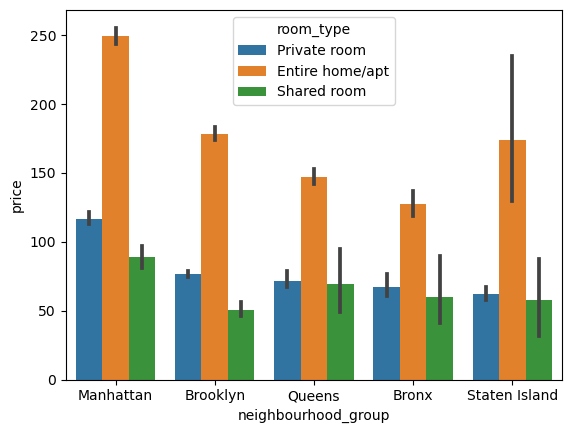

In [53]:
#bölge ve oda tipine göre ücretin görselleştirilmesi
# çizgiler aykırıklıkları ifade etmekte
sns.barplot(x ='neighbourhood_group',y = 'price' ,hue = 'room_type' ,data = df ,order = df.neighbourhood_group.value_counts().index)

In [54]:
#en çok bu hizmeti kullanan kullanıcı(ev sahibi) ve sayısı
top_host=df.host_id.value_counts().head(20)
top_host

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
16098958      96
61391963      91
22541573      87
200380610     65
7503643       52
1475015       52
120762452     50
2856748       49
205031545     49
190921808     47
26377263      43
2119276       39
19303369      37
119669058     34
25237492      34
Name: host_id, dtype: int64

In [55]:
#doğrulama işlemi için calculated_host_listings_count değişkeninin maximum değerini getiriyoruz.
top_host_check=df.calculated_host_listings_count.max()
top_host_check

327

In [56]:
top10_host = df.host_id.value_counts().head(10).index
top10_host #top 10 ev sahibi

Int64Index([219517861, 107434423, 30283594, 137358866, 12243051, 16098958, 61391963, 22541573, 200380610, 7503643], dtype='int64')

In [57]:
top10_host_vis=df.loc[df['host_id'].isin(top10_host)]
top10_host_vis
# e (top10_host) içinde yer alan değerlere sahip gözlemleri filtreledik

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
2631,1390532,Amazing Designer Loft in BK Factory,7503643,Vida,Brooklyn,Greenpoint,40.72456,-73.94343,Entire home/apt,129,30,7,2019-03-27,0.11,52,189,2.0,0.0
2636,1392673,Spacious Factory Converted Loft,7503643,Vida,Brooklyn,Greenpoint,40.72756,-73.94230,Entire home/apt,129,30,6,2018-09-02,0.09,52,249,6.0,1.0
2708,1460017,Lovely Factory Loft in Greenpoint!,7503643,Vida,Brooklyn,Greenpoint,40.72732,-73.94076,Entire home/apt,129,30,6,2018-09-11,0.08,52,277,1.0,0.0
2749,1486099,All New Bohemian Chic 1BR Loft,7503643,Vida,Brooklyn,Greenpoint,40.72267,-73.94362,Entire home/apt,149,30,9,2018-02-18,0.13,52,343,6.0,1.0
2782,1524302,Huge 1 Bedroom Loft at Habitat 101!,7503643,Vida,Brooklyn,Greenpoint,40.72686,-73.94177,Entire home/apt,149,30,7,2018-10-31,0.11,52,281,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48723,36404684,Smart Nolita 1BR w/ W/D near famous cafes by B...,107434423,Blueground,Manhattan,Nolita,40.72283,-73.99472,Entire home/apt,316,30,0,NaT,NaN,232,325,NaN,NaN
48724,36404784,Dapper Hell's Kitchen 2BR w/ Gym + W/D + Door...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76082,-73.99709,Entire home/apt,385,30,0,NaT,NaN,232,338,NaN,NaN
48725,36404815,Trendy Hell's Kitchen 1BR w/ Gym + W/D + Doorm...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76083,-73.99727,Entire home/apt,267,30,0,NaT,NaN,232,228,NaN,NaN
48726,36404936,Beautiful Williamsburg 2BR w/ Skyline views + ...,107434423,Blueground,Brooklyn,Williamsburg,40.71493,-73.96365,Entire home/apt,278,30,0,NaT,NaN,232,188,NaN,NaN


Text(0, 0.5, 'Number of Airbnb')

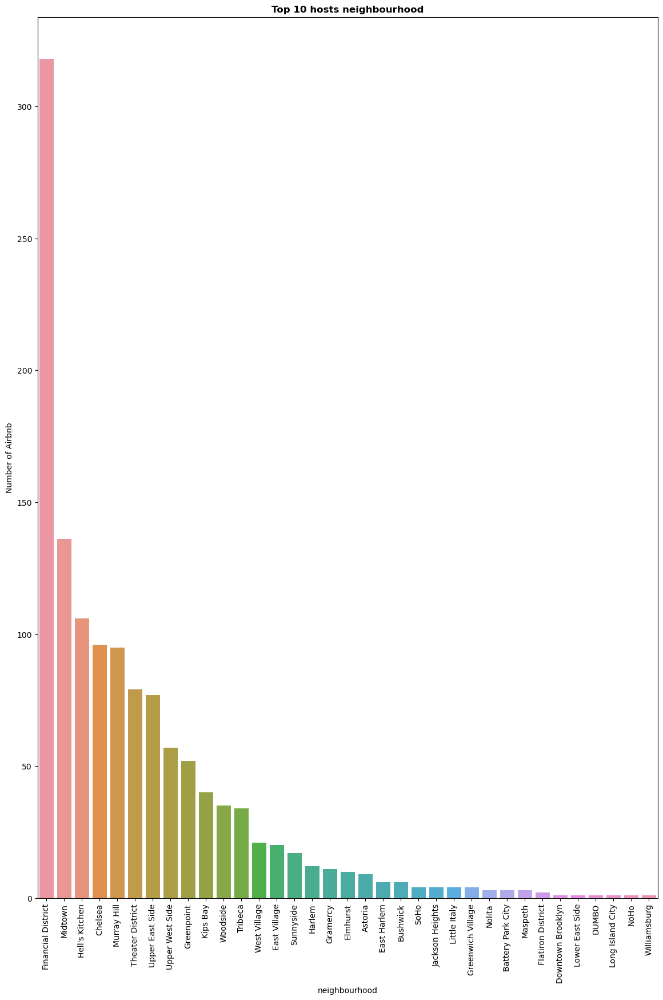

In [58]:
#Bu ilk 10 ev sahibinin mahalle bilgisi.
plt.figure(figsize=(14,20))
sns.countplot(data=top10_host_vis,x='neighbourhood',order = top10_host_vis['neighbourhood'].value_counts().index)
plt.xticks(rotation=90)
plt.title("Top 10 hosts neighbourhood",weight='bold')
plt.ylabel('Number of Airbnb')

<Axes: >

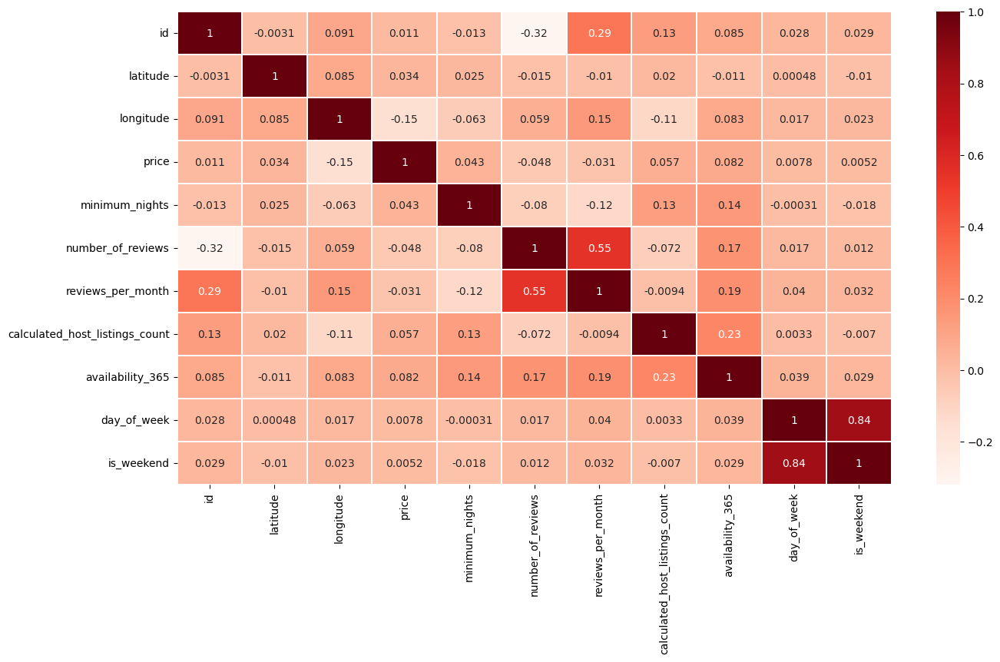

In [59]:
#Corrlation 
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(), annot=True, linewidths=0.1, cmap='Reds') # annot ile her sütundaki korelasyon değerini görüntüledim
# Korelasyon iki değişken arasındaki ilişkiyi ölçmek için kullanılır. Korelasyon, değişkenlerin birlikte hareket etme derecesini ifade eder.

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

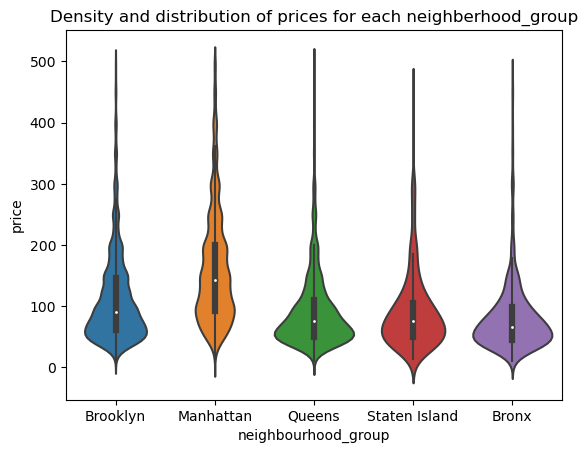

In [60]:
#yoğunluk ve dağılımı gözlemlemek için viyolin grafiği kullanabiliriz. 
#Burada aykırılıkları ve hangi bölgede yoğunlaşma olduğunu açıkça görebiliriz

#uç değerleri olmayan / 500'den az olan bir altküme 
sub_6=df[df.price < 500]
#using violinplot to showcase density and distribtuion of prices 
viz_2=sns.violinplot(data=sub_6, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')#Her mahalle_grubu için fiyatların yoğunluğu ve dağılımına bakalım

## Güzel Bir Analiz

### Burada açıklamalarda ilanlarda name kısmında en çok kullanılan ifadeleri analiz etmek için kullanıyorum

In [61]:
# name sutünunu ufak bi bakalım

#isim dizilerimizi koyacağımız boş liste başlatalım
_names_=[]
#sütundan isim dizelerini alma ve listeye ekleme
for name in df.name:
    _names_.append(name)
#bu isim dizelerini ayrı kelimelere bölecek bir fonksiyon ayarı
def split_name(name):
    spl=str(name).split()
    return spl
#kelimelerin sayılacağı boş listenin başlatılması için
_names_for_count_=[]
#listemizden isim dizesi almak ve split fonksiyonunu kullanmak, daha sonra yukarıdaki listeye eklemek için 
for x in _names_:
    for word in split_name(x):
        word=word.lower()
        _names_for_count_.append(word)
# Yazdıklarımın türkçesi :)  , "name" sütunundaki metin verilerini işleyerek isim dizelerini ayrı kelimelere böler ve her kelimeyi bir listeye ekler      

In [62]:
# Counter kullanalım
from collections import Counter
# ev sahibi tarafından listelerini adlandırmak için kullanılan ilk 25 kelimeyi görmek istiyorum. Farklı bir sayıda olabilir. 
_top_25_w=Counter(_names_for_count_).most_common()
_top_25_w=_top_25_w[0:25]

In [63]:
# şimdi elimizdekileri daha fazla görselleştirme için veri dataframe e koyalım
sub_w=pd.DataFrame(_top_25_w)
sub_w.rename(columns={0:'Words', 1:'Count'}, inplace=True)

[Text(0, 0, 'in'),
 Text(1, 0, 'room'),
 Text(2, 0, 'bedroom'),
 Text(3, 0, 'private'),
 Text(4, 0, 'apartment'),
 Text(5, 0, 'cozy'),
 Text(6, 0, 'the'),
 Text(7, 0, 'to'),
 Text(8, 0, 'studio'),
 Text(9, 0, 'brooklyn'),
 Text(10, 0, 'apt'),
 Text(11, 0, 'spacious'),
 Text(12, 0, '1'),
 Text(13, 0, 'with'),
 Text(14, 0, '2'),
 Text(15, 0, 'of'),
 Text(16, 0, 'east'),
 Text(17, 0, 'and'),
 Text(18, 0, 'manhattan'),
 Text(19, 0, '&'),
 Text(20, 0, 'park'),
 Text(21, 0, 'sunny'),
 Text(22, 0, 'beautiful'),
 Text(23, 0, 'near'),
 Text(24, 0, 'williamsburg')]

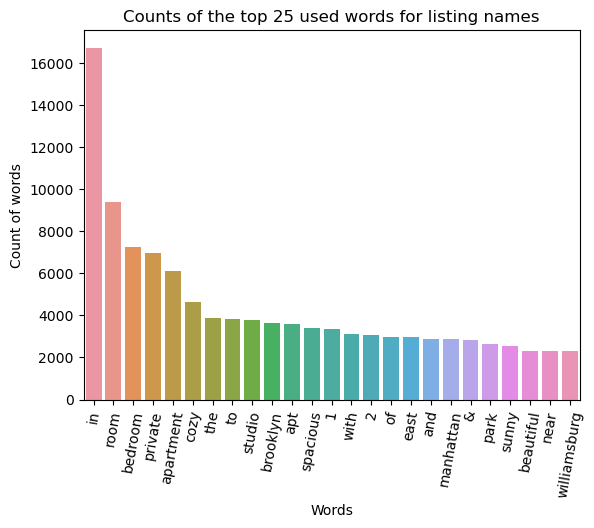

In [64]:
# Hadi birde görselleştirme yapalım :) Barplot iyi gider
viz_5=sns.barplot(x='Words', y='Count', data=sub_w)
viz_5.set_title('Counts of the top 25 used words for listing names')
viz_5.set_ylabel('Count of words')
viz_5.set_xlabel('Words')
viz_5.set_xticklabels(viz_5.get_xticklabels(), rotation=80)

### Bu grafiğe bakarak müşterilerin beklentilerini gözlemleyebiliriz
**En çok kullanılan 25 listenin ad kelimesini bulup bunların üzerinden geçtiğimizi gözlemleyebiliriz - net bir eğilim görebiliriz. Ev sahiplerinin, potansiyel bir gezgin tarafından daha kolay aranabilmesi için kayıtlarını çok özel terimlerle kısa bir biçimde açıkladıklarını gösterir. Bu tür kelimeler 'oda', 'yatak odası', 'özel', 'daire', 'stüdyo'dur. Bu, isimler için kullanılan herhangi bir slogan veya 'popüler/trend' terimi olmadığını gösterir; ev sahipleri, kaydın bulunduğu alanı ve alanı tanımlayan çok basit terimler kullanır. Çok dilli müşterilerle uğraşmak zor olabileceğinden ve kesinlikle alanınızı mümkün olduğunca kısa ve anlaşılır bir biçimde anlatmak istediğinizden, bu tekniğin biraz beklendiği görülmüştür.**

## Kelime Bulutu üzerinden de bir gözlem yapıp, bu şekilde ifade etmeye çalıştım

#### NLP DE SEVERİZ :) 

In [76]:
!pip install textblob

In [77]:
!pip install wordcloud # kelime bulutu en çok kullanılan kelimeleri büyüklük küçüklük vs ye göre ifade eder

In [78]:
from PIL import Image
from textblob import Word, TextBlob
from wordcloud import WordCloud

In [79]:
str(df['name'])

"0                       Clean & quiet apt home by the park\n1                                    Skylit Midtown Castle\n2                      THE VILLAGE OF HARLEM....NEW YORK !\n3                          Cozy Entire Floor of Brownstone\n4         Entire Apt: Spacious Studio/Loft by central park\n                               ...                        \n48890      Charming one bedroom - newly renovated rowhouse\n48891        Affordable room in Bushwick/East Williamsburg\n48892              Sunny Studio at Historical Neighborhood\n48893                 43rd St. Time Square-cozy single bed\n48894    Trendy duplex in the very heart of Hell's Kitchen\nName: name, Length: 48884, dtype: object"

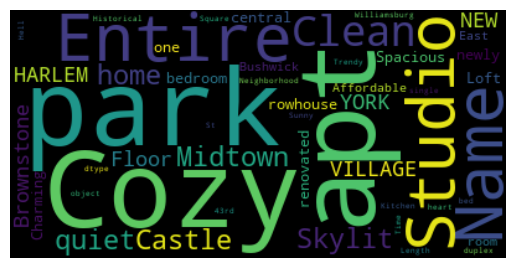

In [80]:

#kelime bulutu
wordcloud = WordCloud().generate(str(df['name']))  # generate et yani oluştur daha sonra göster diyoruz
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


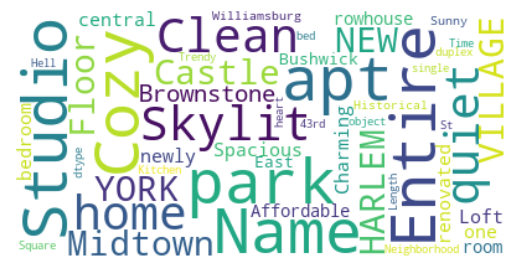

In [81]:
wordcloud = WordCloud(max_font_size=50, #max büyüklük font 50
                      max_words=100, #max kelime sayısı 100
                      background_color="white").generate(str(df['name'])) #arkaplan beyaz

plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [82]:
# wordcloud.to_file("wordcloud.png") 
# Eğer yukarıdaki foto yu katdetmek istersem bu şekilde kaydedip devam edebilirim 

In [65]:
df['name'].head()
# name sütunundaki ,ilk 5 gözlem

0                  Clean & quiet apt home by the park
1                               Skylit Midtown Castle
2                 THE VILLAGE OF HARLEM....NEW YORK !
3                     Cozy Entire Floor of Brownstone
4    Entire Apt: Spacious Studio/Loft by central park
Name: name, dtype: object

### Catplot - mahalle gruplarina göre oda ti̇pleri̇ni̇n fi̇yatlari i̇çi̇n 

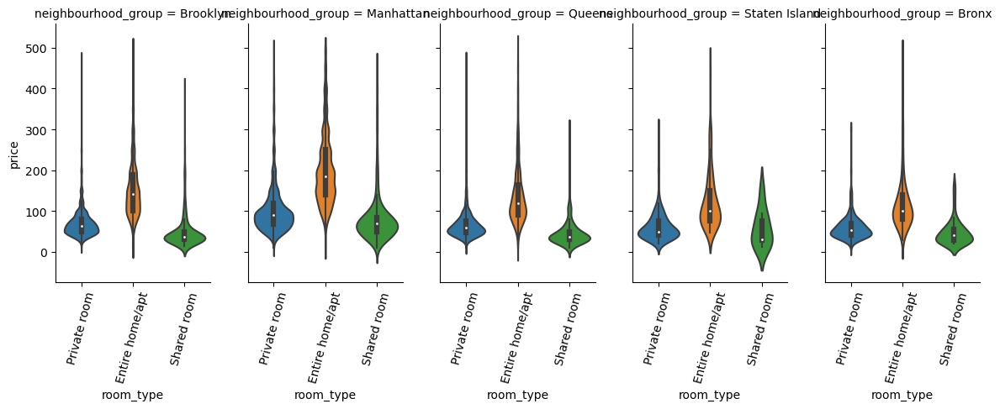

In [66]:
catplot = sns.catplot(x='room_type', y = 'price', col='neighbourhood_group', data = df[df.price < 500], kind='violin',col_wrap=5, height=4, aspect= 0.6)
catplot.set_xticklabels(rotation=75)
#  grafiğin amacı, "room_type" ve "neighbourhood_group" değişkenlerine bağlı olarak "price" değişkeninin dağılımını görselleştirmek

## En çok listeleme yapılan ilk 10 mahalleye göre oda tipi sayısına bakalım

In [67]:
popular_neighbourhood = df.neighbourhood.value_counts().head(10)
df_pop_neighbourhood = df.loc[df['neighbourhood'].isin(popular_neighbourhood.index)]
# yeni bir dataframe oluşturup, ilk 10 mahalleyi ekledim

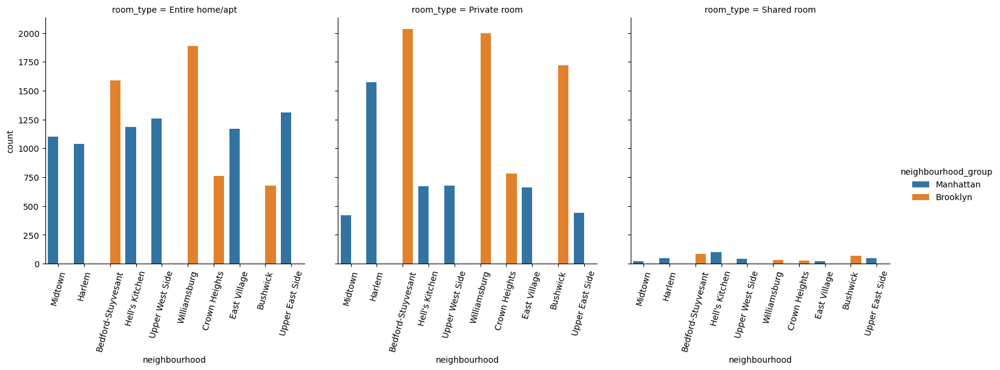

In [68]:
catplot_rmtype = sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type', data = df_pop_neighbourhood, kind='count')
catplot_rmtype.set_xticklabels(rotation=75)
# elde ettiğimiz dataframe e göre bir görselleştirme yapalım

**En çok listeleme yapılan 10 mahalle sadece 2 mahalle grubuna aittir: Manhattan ve Brooklyn, ki bu beklenen bir durumdur çünkü Manhattan ve Brooklyn en çok listelemeye sahip ve en çok seyahat edilen mahallelerdir. Ayrıca Bedford-Stuyvesant ve Williamsburg'un Brooklyn için en popüler olduğunu, Harlem'in ise Manhattan için en popüler olduğunu gözlemliyoruz, en azından Private odalar için.**

## En ucuz 10 mahallenin fiyat dağılımları

In [70]:
cheapest_neighbourhoods = df.groupby('neighbourhood')['price'].median().sort_values(ascending=True).head(10).index
# en ucuz olan ilk 10 mahalleyi belirledik

In [71]:
cheapest_neighbourhoods
# ilk 10 mahallenin indekslerini görüntülüyorum. Bi görselleştirme yaparsam lazım

Index(['Concord', 'Castle Hill', 'New Dorp Beach', 'Corona', 'Hunts Point', 'Tremont', 'Bull's Head', 'Mount Eden', 'Whitestone', 'Soundview'], dtype='object', name='neighbourhood')

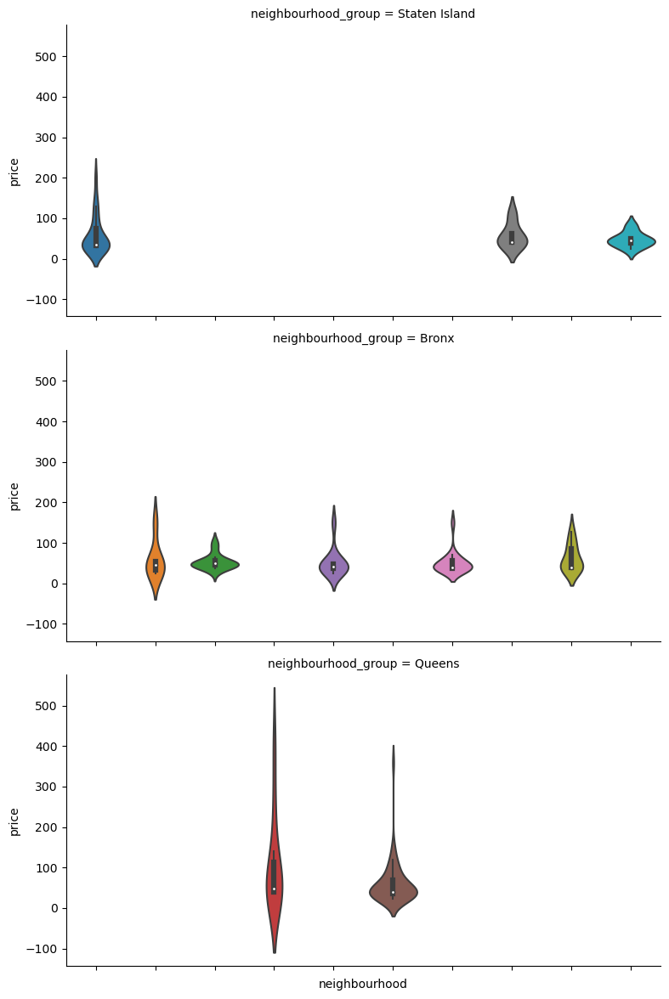

In [72]:
df_cheapest_neighbourhoods = df[df.neighbourhood.isin(cheapest_neighbourhoods)]
catplot_cheap = sns.catplot(x='neighbourhood', y='price', data = df_cheapest_neighbourhoods, col = 'neighbourhood_group', col_wrap = 1, kind='violin', height=4, aspect= 2)
catplot_cheap.set_xticklabels(rotation=75)
#Grafik, her bir mahalle grubu için ayrı bir alt grafik oluştur. Her alt grafikte, mahallelerin fiyat dağılımlarını gösteren bir keman grafiği (violin plot) çizilir. 
#Ayrıca, x-eksenindeki etiketler 75 derece döndürülerek daha iyi okunabilirlik sağlanır. Bu kod, en düşük fiyatlı olan ilk 10 mahallenin fiyat dağılımlarını görselleştirmek için kullanılır.



**En ucuz mahalleler Staten Island, Bronx ve Queens'in yanı sıra şaşırtıcı bir şekilde Brooklyn'de yer almaktadır. Hepsinde oldukça az sayıda veri bulunuyor.**

## Fiyata ilişkin inceleme

<Axes: xlabel='number_of_reviews', ylabel='price'>

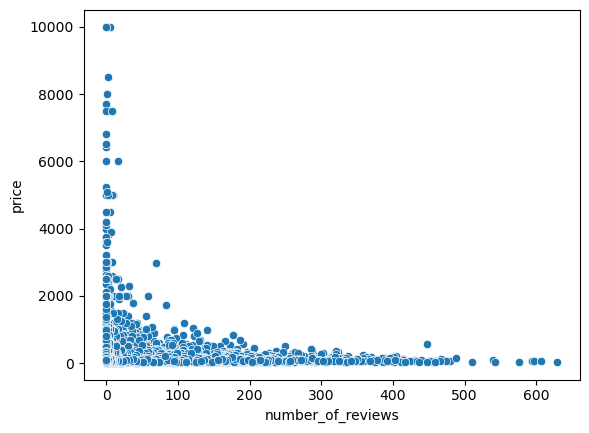

In [73]:
sns.scatterplot(x='number_of_reviews', y = 'price', data = df)
# her bir gözlem birimi için inceleme sayısının fiyat üzerindeki etkisini görselleştirir

**En pahalı airbnb'lerde çok az yorum olduğunu ve yorum sayısı ile fiyatın negatif ilişkili olduğunu görüyoruz. Pahalı airbnb'ler için düşük yorum sayısının, müşterilerin olumsuz deneyimleri olduğunda yorum bırakmaya daha meyilli olmaları nedeniyle daha iyi deneyimlerden veya daha ucuz alternatifler mevcutken pahalı airbnb'lere olan düşük talepten kaynaklanıyor olması muhtemeldir.**

## Harita Üzeriniden Görselleştirme 

<Axes: xlabel='longitude', ylabel='latitude'>

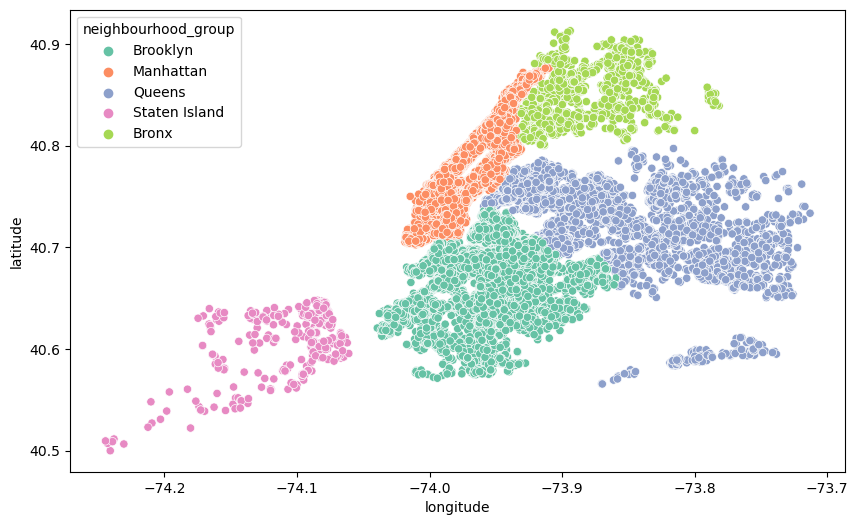

In [74]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='neighbourhood_group', palette='Set2')
#  nokta dağılım grafiği çizerim. Bu kodu kullanarak konum verilerini görselleştirebilir ve farklı mahalle gruplarının dağılımını gözlemleyebilirsiniz.

<Axes: xlabel='longitude', ylabel='latitude'>

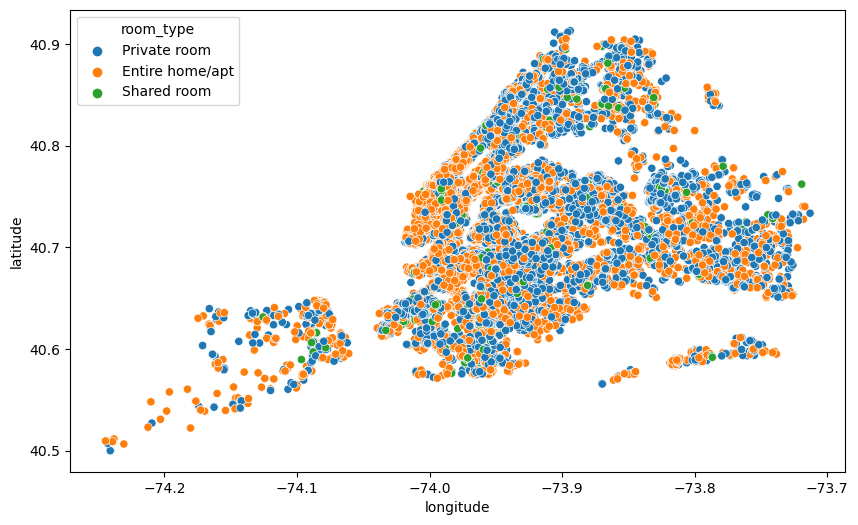

In [75]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='longitude',y='latitude',data=df,hue='room_type')
# nokta dağılım grafiği çizeriz.  konum verilerini ve oda tiplerinin dağılımını görselleştirebilirsiniz.

### Bu kısımda makine öğrenmesi adımına geçmeden bir hata alıyoruz o da MinMaxScaler hatası. Bunun sebebi string verileri doğrudan dönüştürememesidir. 
### Veri setininde sayısal olmayan (string) veriler bulunması, bu hatayı tetiklemektedir. Bunun için string değerleri uçurmamız gerekiyor :)

In [83]:
# Buradaki amacımız eksik değerleri doldurmak. Bazılarını mod(tekrar) ile bazısını mean(ortalama) ile dolduruyorum
df = df.fillna(df['last_review'].mode())
df = df.fillna(df['name'].mode())
df = df.fillna(df['host_id'].mode())
df = df.fillna(df['reviews_per_month'].mean())

In [84]:
#check the numerical column and categorical column 
cat = []
num = []
for i in df.columns:
    if df[i].dtypes=='O':
            cat.append(i)
    else:
        num.append(i)
print('The numerical columns are',num)
print('The catagorical columns are',cat)
#  veri kümesindeki sütunları sayısal (numerik) ve kategorik (kategorik) sütunlar olarak ayırıyorum. Her sütunun veri türünü kontrol eder ve sayısal sütunları num listesine, 
# kategorik sütunları ise cat listesine ekler.

The numerical columns are ['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'day_of_week', 'is_weekend']
The catagorical columns are ['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review']


In [85]:
df.drop(['name', 'host_name', 'last_review'], axis=1, inplace=True)
#veri kümesindeki belirli sütunları çıkarmak ve analiz veya modelleme için gereksiz olan sütunları veri kümesinden kaldırmak için kullanırım.

## Feature Engineering
**Bu kısımda veri kümesinin özellikleri (features) kullanılarak yeni ve anlamlı özelliklerin oluşturulması ve çıkarılması amaçlanır**

In [86]:

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
le =preprocessing.LabelEncoder()
df.select_dtypes(object)
# Burada kategorik özellikleri sayısal etiketlere dönüştürmek için çalışıyorum. Bunu da LabelEncoder ile hedefliyorum


,neighbourhood_group,neighbourhood,room_type
0,Brooklyn,Kensington,Private room
1,Manhattan,Midtown,Entire home/apt
2,Manhattan,Harlem,Private room
3,Brooklyn,Clinton Hill,Entire home/apt
4,Manhattan,East Harlem,Entire home/apt
...,...,...,...
48890,Brooklyn,Bedford-Stuyvesant,Private room
48891,Brooklyn,Bushwick,Private room
48892,Manhattan,Harlem,Entire home/apt
48893,Manhattan,Hell's Kitchen,Shared room


In [87]:
le = preprocessing.LabelEncoder()
le.fit(df['neighbourhood_group'])    
df['neighbourhood_group']=le.transform(df['neighbourhood_group'])

le = preprocessing.LabelEncoder()
le.fit(df['neighbourhood'])
df['neighbourhood']=le.transform(df['neighbourhood'])

le = preprocessing.LabelEncoder()
le.fit(df['room_type'])
df['room_type']=le.transform(df['room_type'])
# Bu işlem, "neighbourhood_group", "neighbourhood" ve "room_type" özelliklerini kategorik değerlerden sayısal etiketlere dönüştürmek için kullanıyorum

In [88]:
df.head()
     

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
0,2539,2787,1,108,40.64749,-73.97237,1,149,1,9,0.210000,6,365,4.000000,0.000000
1,2595,2845,2,127,40.75362,-73.98377,0,225,1,45,0.380000,2,355,1.000000,0.000000
2,3647,4632,2,94,40.80902,-73.94190,1,150,3,0,1.373128,1,365,1.373128,1.373128
3,3831,4869,1,41,40.68514,-73.95976,0,89,1,270,4.640000,1,194,4.000000,0.000000
4,5022,7192,2,61,40.79851,-73.94399,0,80,10,9,0.100000,1,0,0.000000,0.000000


In [89]:

x = df.drop('room_type',1)
y = df['room_type']
# veri setinin hedef değişkenini ve bağımsız değişkenlerini ayırmak için 
#bağımsız değişkenler x ve hedef değişken y olarak ayrılmış olur. Bu ayrım, ML de eğitimi ve testi için veri setini hazırlarken kulllanıcam

In [90]:

from sklearn.model_selection import train_test_split
# veri setini bölüyorum     

In [91]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y,test_size=0.2,random_state=2)

# normalization technique

In [92]:
from sklearn.preprocessing import MinMaxScaler
# Verileri ölçeklerndirmek için kullanıyorum

In [93]:

# eğitim verilerini ölçekliyorum
norm = MinMaxScaler().fit(xtrain)
#  training data dönüştürüyorum
X_train_norm = norm.transform(xtrain)
# aynı şekilde testing data dönüştürüyorum
X_test_norm = norm.transform(xtest)

In [94]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report


In [95]:
lr = LogisticRegression()
dt = DecisionTreeClassifier()
rn = RandomForestClassifier()
knn = KNeighborsClassifier()
gb = GaussianNB()
sgd = SGDClassifier()

In [96]:
#logistic regression classifier

In [97]:
lr.fit(X_train_norm,ytrain)
lr.predict(X_test_norm)
lr.score(X_test_norm,ytest)

0.7516620640278204

In [98]:
lr.fit(X_train_norm,ytrain)
ypred = lr.predict(X_test_norm)
accuracy_score(ypred,ytest)

0.7516620640278204

In [99]:
print('classification report: \n',classification_report(ytest,ypred))

classification report: 
               precision    recall  f1-score   support

           0       0.79      0.77      0.78      5073
           1       0.71      0.77      0.74      4457
           2       0.00      0.00      0.00       247

    accuracy                           0.75      9777
   macro avg       0.50      0.51      0.51      9777
weighted avg       0.73      0.75      0.74      9777



In [100]:
# decision tree classifier

In [101]:
dt.fit(X_train_norm,ytrain)
dt.predict(X_test_norm)
dt.score(X_test_norm,ytest)

0.7857215914902321

In [102]:
dt.fit(X_train_norm,ytrain)
ypred = dt.predict(X_test_norm)
accuracy_score(ypred,ytest)


0.7824486038662166

In [103]:
print('classification report: \n',classification_report(ytest,ypred))

classification report: 
               precision    recall  f1-score   support

           0       0.82      0.81      0.82      5073
           1       0.76      0.77      0.77      4457
           2       0.38      0.43      0.40       247

    accuracy                           0.78      9777
   macro avg       0.66      0.67      0.66      9777
weighted avg       0.78      0.78      0.78      9777



In [104]:
#random forest classifier

In [105]:
rn.fit(X_train_norm,ytrain)
rn.predict(X_test_norm)
rn.score(X_test_norm,ytest)


0.8612048685690907

In [106]:
rn.fit(X_train_norm,ytrain)
ypred = rn.predict(X_test_norm)
accuracy_score(ypred,ytest)


0.8592615321673315

In [107]:
print('classification report: \n',classification_report(ytest,ypred))

classification report: 
               precision    recall  f1-score   support

           0       0.87      0.89      0.88      5073
           1       0.84      0.85      0.85      4457
           2       0.98      0.35      0.51       247

    accuracy                           0.86      9777
   macro avg       0.90      0.70      0.75      9777
weighted avg       0.86      0.86      0.86      9777



In [108]:
# K Nearest Neighbor

In [109]:
knn.fit(X_train_norm,ytrain)
knn.predict(X_test_norm)
knn.score(X_test_norm,ytest)

0.5960928710238315

In [110]:
knn.fit(X_train_norm,ytrain)
ypred = knn.predict(X_test_norm)
accuracy_score(ypred,ytest)


0.5960928710238315

In [111]:
print('classification report: \n',classification_report(ytest,ypred))

classification report: 
               precision    recall  f1-score   support

           0       0.62      0.66      0.64      5073
           1       0.57      0.55      0.56      4457
           2       0.64      0.12      0.20       247

    accuracy                           0.60      9777
   macro avg       0.61      0.44      0.47      9777
weighted avg       0.60      0.60      0.59      9777



In [112]:
#Gaussian Naive Bayes 

In [113]:
gb.fit(X_train_norm,ytrain)
gb.predict(X_test_norm)
gb.score(X_test_norm,ytest)

0.508438171218165

In [114]:
gb.fit(X_train_norm,ytrain)
ypred = gb.predict(X_test_norm)
accuracy_score(ypred,ytest)

0.508438171218165

In [115]:
print('classification report: \n',classification_report(ytest,ypred))

classification report: 
               precision    recall  f1-score   support

           0       0.83      0.14      0.24      5073
           1       0.48      0.95      0.64      4457
           2       0.03      0.02      0.03       247

    accuracy                           0.51      9777
   macro avg       0.45      0.37      0.30      9777
weighted avg       0.65      0.51      0.42      9777



In [116]:
#Stochastic Gradient Descent

In [117]:
sgd.fit(X_train_norm,ytrain)
sgd.predict(X_test_norm)
sgd.score(X_test_norm,ytest)

0.6307660836657462

In [118]:
sgd.fit(X_train_norm,ytrain)
ypred = sgd.predict(X_test_norm)
accuracy_score(ypred,ytest)

0.6515290989055947

In [119]:
print('classification report: \n',classification_report(ytest,ypred))

classification report: 
               precision    recall  f1-score   support

           0       0.67      0.72      0.69      5073
           1       0.63      0.61      0.62      4457
           2       0.00      0.00      0.00       247

    accuracy                           0.65      9777
   macro avg       0.43      0.44      0.44      9777
weighted avg       0.63      0.65      0.64      9777



### Yukarıda kullanılan sınıflandırma modelindeki tüm algoritmalar

In [120]:
li = [lr,rn,dt,knn,gb,sgd]                   
for i in li: 
    print(i)
    i.fit(X_train_norm,ytrain)
    i.predict(xtest)
    print('accuracy:',i.score(X_test_norm,ytest))
    if i==sgd:
        continue
    print('*'*29)


LogisticRegression()
accuracy: 0.7516620640278204
*****************************
RandomForestClassifier()
accuracy: 0.8628413623810985
*****************************
DecisionTreeClassifier()
accuracy: 0.7843919402679759
*****************************
KNeighborsClassifier()
accuracy: 0.5960928710238315
*****************************
GaussianNB()
accuracy: 0.508438171218165
*****************************
SGDClassifier()
accuracy: 0.6334253861102588


In [121]:
li = [lr,rn,dt,knn,gb,sgd]                         
di = {}
for i in li:
    i.fit(X_train_norm,ytrain)
    ypred = i.predict(X_test_norm)
    print(i,":",accuracy_score(ypred,ytest),'\n')
    di.update({str(i):i.score(X_test_norm,ytest)})
    print('Classification report: \n',classification_report(ytest,ypred))
    if i==sgd:
        continue
    print('*'*55)


LogisticRegression() : 0.7516620640278204 

Classification report: 
               precision    recall  f1-score   support

           0       0.79      0.77      0.78      5073
           1       0.71      0.77      0.74      4457
           2       0.00      0.00      0.00       247

    accuracy                           0.75      9777
   macro avg       0.50      0.51      0.51      9777
weighted avg       0.73      0.75      0.74      9777

*******************************************************
RandomForestClassifier() : 0.8597729364835839 

Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.89      0.88      5073
           1       0.84      0.85      0.85      4457
           2       0.95      0.34      0.50       247

    accuracy                           0.86      9777
   macro avg       0.89      0.69      0.74      9777
weighted avg       0.86      0.86      0.86      9777

****************************************

## Şimde de bir Acc grafiği çizelim

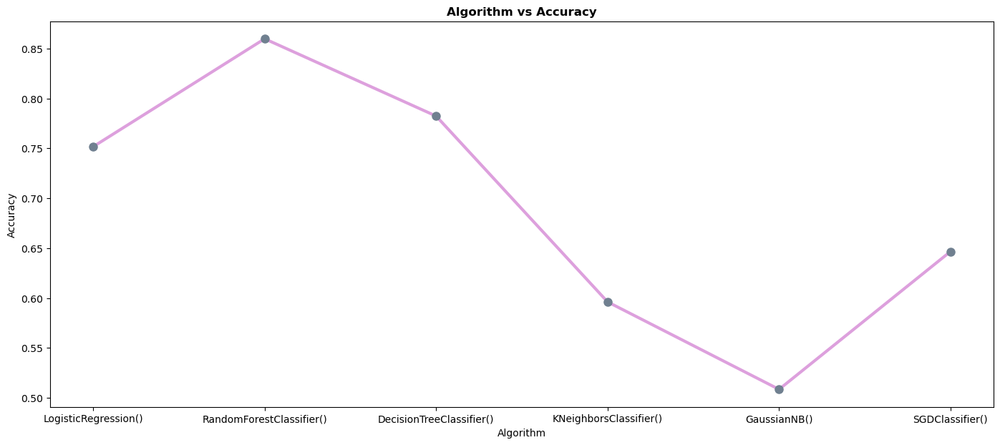

In [122]:
plt.figure(figsize=(17, 7))
plt.title("Algorithm vs Accuracy", fontweight='bold')
plt.xlabel("Algorithm",)
plt.ylabel("Accuracy")
plt.plot(di.keys(),di.values(),marker='o',color='plum',linewidth=3,markersize=8,
         markerfacecolor='slategray',markeredgecolor='slategray')
plt.show()

